In [1]:
from hdfs import InsecureClient
import pandas as pd

# Configuration
NAMENODE_HOST = 'localhost'
WEBHDFS_PORT = '9870'
HDFS_PATH = '/user/anjalijha/real_time_routes_simulated_expanded_1.csv'
HDFS_USER = 'anjalijha'

# Connect to WebHDFS
client = InsecureClient(f'http://{NAMENODE_HOST}:{WEBHDFS_PORT}', user=HDFS_USER)

# Read CSV from HDFS in chunks and store in DataFrame
chunk_size = 10000  # Adjust this based on your memory capacity
df_list = []

try:
    with client.read(HDFS_PATH, encoding='utf-8') as reader:
        # Read in chunks and append each chunk to a list
        for chunk in pd.read_csv(reader, chunksize=chunk_size):
            df_list.append(chunk)  # Append each chunk
            print(chunk)

    # Combine all chunks into one DataFrame
    df = pd.concat(df_list, ignore_index=True)

    print(df.head())  # Display first few rows of the DataFrame

except Exception as e:
    print(f"Error: {e}")


                       Timestamp          Origin     Destination  \
0     2025-05-02 05:08:49.998018  Harrisburg, PA   Nashville, TN   
1     2025-05-02 05:08:52.062948  Harrisburg, PA   Nashville, TN   
2     2025-05-02 05:08:53.165722  Harrisburg, PA   Nashville, TN   
3     2025-05-02 05:08:54.698777  Harrisburg, PA   Nashville, TN   
4     2025-05-02 05:08:55.789374  Harrisburg, PA   Nashville, TN   
...                          ...             ...             ...   
9995  2025-05-02 12:36:46.069806   Baltimore, MD  Harrisburg, PA   
9996  2025-05-02 12:36:48.514181   Baltimore, MD  Harrisburg, PA   
9997  2025-05-02 12:36:51.090255   Baltimore, MD  Harrisburg, PA   
9998  2025-05-02 12:36:54.511242   Baltimore, MD   Nashville, TN   
9999  2025-05-02 12:36:57.104464   Baltimore, MD   Nashville, TN   

      DistanceMiles  DurationHours  Weather  Temperature    SourceAPI  \
0            719.63      11.549783    18.36          NaN       Google   
1            718.66      13.257986   

In [2]:
from pyspark.sql import SparkSession

# Start Spark session
spark = SparkSession.builder.appName("ShippingProject").getOrCreate()

Setting default log level to "WARN".
To adjust logging level use sc.setLogLevel(newLevel). For SparkR, use setLogLevel(newLevel).
25/05/11 16:38:24 WARN NativeCodeLoader: Unable to load native-hadoop library for your platform... using builtin-java classes where applicable
25/05/11 16:38:24 WARN Utils: Service 'SparkUI' could not bind on port 4040. Attempting port 4041.


In [3]:
from pyspark.sql.functions import to_timestamp, col

df = df.withColumn("Timestamp", to_timestamp("Timestamp")) \
       .withColumn("DistanceMiles", col("DistanceMiles").cast("float")) \
       .withColumn("DurationHours", col("DurationHours").cast("float")) \
       .withColumn("Temperature", col("Temperature").cast("float"))


In [4]:
df_clean = df.dropna(subset=["Origin", "Destination", "DistanceMiles", "DurationHours", "Timestamp"])


In [5]:
df_clean = df_clean.filter((col("DistanceMiles") > 0) & (col("DurationHours") > 0) & (col("DurationHours") < 48))


In [6]:
df_clean.printSchema()

from pyspark.sql.functions import expr

df_clean = df_clean.withColumn("SpeedMPH", expr("DistanceMiles / DurationHours"))

df_clean.describe(["DistanceMiles", "DurationHours", "Temperature", "SpeedMPH"]).show()
df_clean.select("Origin", "Destination").distinct().count()


root
 |-- Timestamp: timestamp (nullable = true)
 |-- Origin: string (nullable = true)
 |-- Destination: string (nullable = true)
 |-- DistanceMiles: float (nullable = true)
 |-- DurationHours: float (nullable = true)
 |-- Weather: double (nullable = true)
 |-- Temperature: float (nullable = true)
 |-- SourceAPI: string (nullable = true)
 |-- Scenario: string (nullable = true)



25/05/11 13:49:03 WARN SparkStringUtils: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.


+-------+------------------+------------------+-----------+------------------+
|summary|     DistanceMiles|     DurationHours|Temperature|          SpeedMPH|
+-------+------------------+------------------+-----------+------------------+
|  count|          55512949|          55512949|          0|          55512949|
|   mean|1359.3626607440024|21.680436210619185|       NULL| 61.53926976828289|
| stddev| 825.9050208903068|12.757268290905005|       NULL| 5.832739537659299|
|    min|             38.41|        0.76882285|       NULL|20.586969264377935|
|    max|           3372.49|         47.999996|       NULL| 82.01261738911144|
+-------+------------------+------------------+-----------+------------------+



380

In [7]:
df_clean.printSchema()
df_clean.show(5)
print("Number of rows:", df_clean.count())


root
 |-- Timestamp: timestamp (nullable = true)
 |-- Origin: string (nullable = true)
 |-- Destination: string (nullable = true)
 |-- DistanceMiles: float (nullable = true)
 |-- DurationHours: float (nullable = true)
 |-- Weather: double (nullable = true)
 |-- Temperature: float (nullable = true)
 |-- SourceAPI: string (nullable = true)
 |-- Scenario: string (nullable = true)
 |-- SpeedMPH: double (nullable = true)

+--------------------+--------------+-------------+-------------+-------------+-------+-----------+-----------+-----------+------------------+
|           Timestamp|        Origin|  Destination|DistanceMiles|DurationHours|Weather|Temperature|  SourceAPI|   Scenario|          SpeedMPH|
+--------------------+--------------+-------------+-------------+-------------+-------+-----------+-----------+-----------+------------------+
|2025-05-02 05:08:...|Harrisburg, PA|Nashville, TN|       719.63|    11.549783|  18.36|       NULL|     Google|Simulated_0| 62.30680007348798|
|2025-0

Number of rows: 55512949


In [8]:
from pyspark.sql.functions import avg, min, max, stddev, count

df_clean.select(
    avg("DistanceMiles").alias("AvgDistance"),
    min("DistanceMiles").alias("MinDistance"),
    max("DistanceMiles").alias("MaxDistance"),
    stddev("DistanceMiles").alias("StdDevDistance"),
    
    avg("DurationHours").alias("AvgDuration"),
    min("DurationHours").alias("MinDuration"),
    max("DurationHours").alias("MaxDuration"),
    stddev("DurationHours").alias("StdDevDuration"),
    
    avg("Temperature").alias("AvgTemperature")
).show()


+------------------+-----------+-----------+-----------------+------------------+-----------+-----------+------------------+--------------+
|       AvgDistance|MinDistance|MaxDistance|   StdDevDistance|       AvgDuration|MinDuration|MaxDuration|    StdDevDuration|AvgTemperature|
+------------------+-----------+-----------+-----------------+------------------+-----------+-----------+------------------+--------------+
|1359.3626607440024|      38.41|    3372.49|825.9050208903068|21.680436210619185| 0.76882285|  47.999996|12.757268290905005|          NULL|
+------------------+-----------+-----------+-----------------+------------------+-----------+-----------+------------------+--------------+



In [9]:
df_clean.groupBy("Origin").count().orderBy("count", ascending=False).show(10)
df_clean.groupBy("Destination").count().orderBy("count", ascending=False).show(10)


+------------------+-------+
|            Origin|  count|
+------------------+-------+
|Salt Lake City, UT|2904338|
|        Denver, CO|2903000|
|     Nashville, TN|2901000|
|    Harrisburg, PA|2889507|
|       Houston, TX|2888000|
|    Cincinnati, OH|2887000|
|       Chicago, IL|2881000|
|       Detroit, MI|2870000|
|         Boise, ID|2850356|
|    Pittsburgh, PA|2849840|
+------------------+-------+
only showing top 10 rows



+------------------+-------+
|       Destination|  count|
+------------------+-------+
|    Cincinnati, OH|2884000|
|       Detroit, MI|2884000|
|    Pittsburgh, PA|2882712|
|       Houston, TX|2882000|
|     Nashville, TN|2881000|
|        Denver, CO|2881000|
|Salt Lake City, UT|2880270|
|       Chicago, IL|2880000|
|    Harrisburg, PA|2861514|
|     Las Vegas, NV|2852865|
+------------------+-------+
only showing top 10 rows



In [10]:
df_clean.groupBy("Weather").agg(
    avg("DurationHours").alias("AvgDuration"),
    count("*").alias("TripCount")
).orderBy("AvgDuration", ascending=False).show()

from pyspark.sql.functions import when

df_temp = df_clean.withColumn("TempBucket",
    when(col("Temperature") < 0, "Freezing")
    .when(col("Temperature") < 15, "Cold")
    .when(col("Temperature") < 25, "Mild")
    .when(col("Temperature") < 35, "Warm")
    .otherwise("Hot")
)

df_temp.groupBy("TempBucket").agg(avg("DurationHours").alias("AvgDuration")).orderBy("AvgDuration").show()


+-------+------------------+---------+
|Weather|       AvgDuration|TripCount|
+-------+------------------+---------+
|  14.46| 46.17916164519681|      785|
|  20.88|45.647256809098614|      589|
|  21.12| 44.73394071329119|     1542|
|   22.6| 44.21289432955351|     2459|
|  16.18|42.854213314921886|     4672|
|  29.46| 42.83704470516591|      979|
|   9.21| 42.64667342014043|     2901|
|  15.94|42.390312024891465|     1953|
|  25.25|41.897075763924086|      998|
|  13.71|41.885403745450006|     9118|
|  12.66|40.810833930123934|     5641|
|  24.09| 40.62086297157116|     5852|
|  13.21| 40.50563201164068|    15151|
|  12.91|  40.4734130074214|     5150|
|  10.72| 39.95899608738178|    16394|
|   12.7|  39.7909553527832|     2000|
|  15.67|39.569210102233114|    11810|
|  15.81|39.287207836151126|     3000|
|  21.46|38.779066399817204|    11687|
|  25.86| 38.65950121609032|     2256|
+-------+------------------+---------+
only showing top 20 rows



+----------+------------------+
|TempBucket|       AvgDuration|
+----------+------------------+
|       Hot|21.680436210619185|
+----------+------------------+



In [11]:
sample_df = df_clean.select("DistanceMiles", "DurationHours", "Temperature", "Origin", "Destination").sample(False, 0.05)
sample_pd = sample_df.toPandas()


/var/folders/q1/s56wkb250tg61dj00_nj3vsr0000gn/T/ipykernel_21242/162672629.py:8: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()
/opt/anaconda3/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


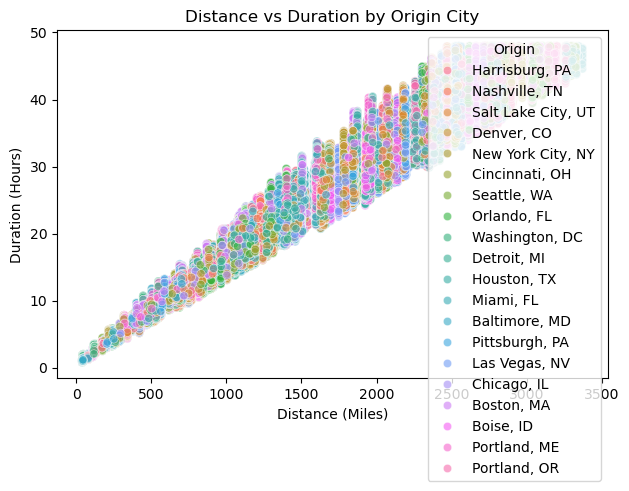

In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.scatterplot(data=sample_pd, x="DistanceMiles", y="DurationHours", hue="Origin", alpha=0.6)
plt.title("Distance vs Duration by Origin City")
plt.xlabel("Distance (Miles)")
plt.ylabel("Duration (Hours)")
plt.tight_layout()
plt.show()


In [13]:
from pyspark.sql.functions import round

distance_matrix = df_clean.groupBy("Origin", "Destination").agg(
    round(avg("DistanceMiles"), 2).alias("AvgDistance"),
    round(avg("DurationHours"), 2).alias("AvgDuration")
)

distance_matrix.orderBy("AvgDistance").show(20, truncate=False)


+-----------------+-----------------+-----------+-----------+
|Origin           |Destination      |AvgDistance|AvgDuration|
+-----------------+-----------------+-----------+-----------+
|Washington, DC   |Baltimore, MD    |43.79      |1.21       |
|Baltimore, MD    |Washington, DC   |44.65      |1.17       |
|Baltimore, MD    |Harrisburg, PA   |78.9       |1.55       |
|Harrisburg, PA   |Baltimore, MD    |78.93      |1.52       |
|Portland, ME     |Boston, MA       |107.59     |2.03       |
|Boston, MA       |Portland, ME     |107.87     |2.03       |
|Washington, DC   |Harrisburg, PA   |120.94     |2.55       |
|Harrisburg, PA   |Washington, DC   |121.67     |2.56       |
|Harrisburg, PA   |New York City, NY|171.3      |3.21       |
|New York City, NY|Harrisburg, PA   |171.84     |3.26       |
|Seattle, WA      |Portland, OR     |174.66     |3.21       |
|Portland, OR     |Seattle, WA      |174.8      |3.2        |
|New York City, NY|Baltimore, MD    |189.42     |3.59       |
|Baltimo

In [14]:
from_harrisburg = distance_matrix.filter(distance_matrix["Origin"] == "Harrisburg, PA")
from_harrisburg.orderBy("AvgDistance").show(20, truncate=False)


+--------------+------------------+-----------+-----------+
|Origin        |Destination       |AvgDistance|AvgDuration|
+--------------+------------------+-----------+-----------+
|Harrisburg, PA|Baltimore, MD     |78.93      |1.52       |
|Harrisburg, PA|Washington, DC    |121.67     |2.56       |
|Harrisburg, PA|New York City, NY |171.3      |3.21       |
|Harrisburg, PA|Pittsburgh, PA    |203.28     |3.58       |
|Harrisburg, PA|Boston, MA        |394.89     |7.13       |
|Harrisburg, PA|Cincinnati, OH    |472.14     |8.0        |
|Harrisburg, PA|Detroit, MI       |482.71     |7.89       |
|Harrisburg, PA|Portland, ME      |495.19     |8.74       |
|Harrisburg, PA|Chicago, IL       |657.95     |10.82      |
|Harrisburg, PA|Nashville, TN     |719.39     |11.68      |
|Harrisburg, PA|Orlando, FL       |963.88     |15.76      |
|Harrisburg, PA|Miami, FL         |1167.59    |19.0       |
|Harrisburg, PA|Houston, TX       |1464.03    |23.45      |
|Harrisburg, PA|Denver, CO        |1632.

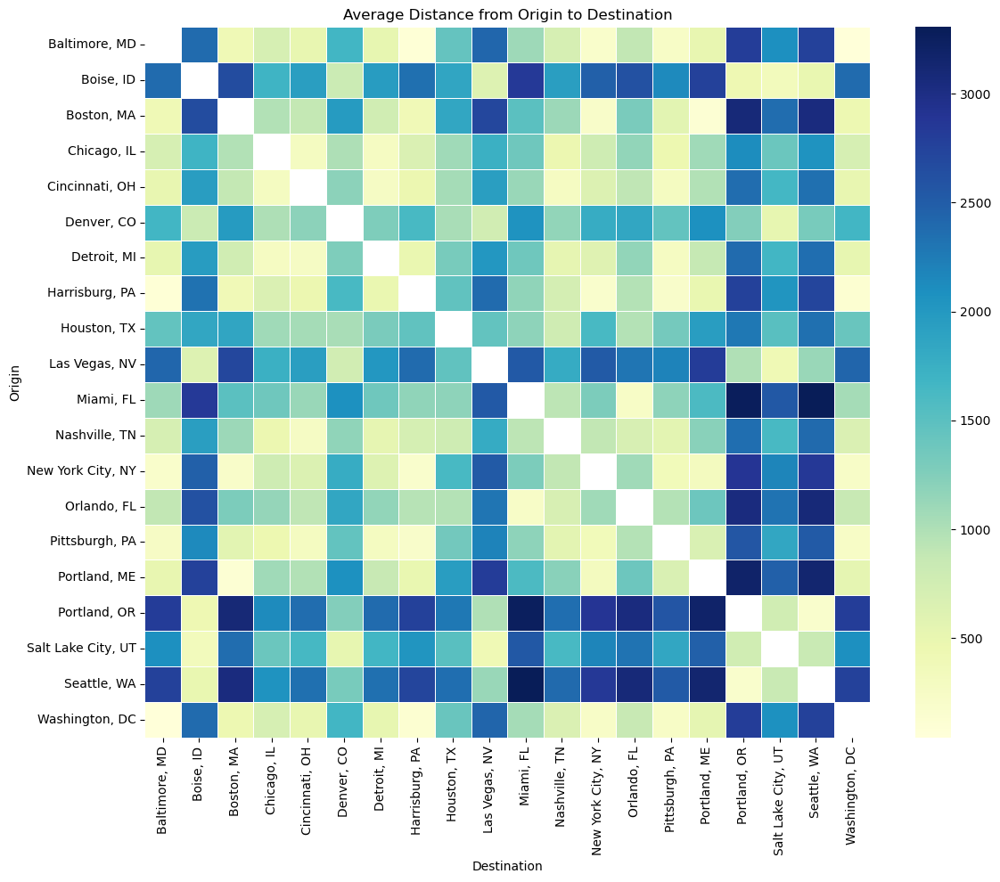

In [15]:
dm_pd = distance_matrix.toPandas()
pivot = dm_pd.pivot(index='Origin', columns='Destination', values='AvgDistance')

# Visual heatmap
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 10))
sns.heatmap(pivot, cmap="YlGnBu", linewidths=0.5)
plt.title("Average Distance from Origin to Destination")
plt.tight_layout()
plt.show()


In [16]:
from pyspark.sql.functions import col, avg
from pyspark.ml.feature import StringIndexer, VectorAssembler
from pyspark.ml.clustering import KMeans


df_cast = df_clean \
    .withColumn("DistanceMiles", col("DistanceMiles").cast("float")) \
    .withColumn("DurationHours", col("DurationHours").cast("float")) \
    .withColumn("Temperature", col("Temperature").cast("float"))


origin_indexer = StringIndexer(inputCol="Origin", outputCol="OriginIndex").fit(df_cast)
df_indexed = origin_indexer.transform(df_cast)

destination_indexer = StringIndexer(inputCol="Destination", outputCol="DestinationIndex").fit(df_indexed)
df_indexed = destination_indexer.transform(df_indexed)


df_ready = df_indexed.dropna(subset=[
    "OriginIndex", "DestinationIndex", "DistanceMiles", "DurationHours"
])

print("🧼 Rows after cleaning:", df_ready.count())


assembler = VectorAssembler(
    inputCols=["OriginIndex", "DestinationIndex", "DistanceMiles", "DurationHours"],
    outputCol="features",
    handleInvalid="skip"
)

df_features = assembler.transform(df_ready).filter(col("features").isNotNull())

print("✅ Final rows in df_features:", df_features.count())
df_features.select("features").show(5, truncate=False)



🧼 Rows after cleaning: 55512949


✅ Final rows in df_features: 55512949
+----------------------------------------------+
|features                                      |
+----------------------------------------------+
|[3.0,5.0,719.6300048828125,11.549782752990723]|
|[3.0,5.0,718.6599731445312,13.25798511505127] |
|[3.0,5.0,718.030029296875,10.529318809509277] |
|[3.0,5.0,719.1400146484375,10.713395118713379]|
|[3.0,5.0,719.3800048828125,11.732792854309082]|
+----------------------------------------------+
only showing top 5 rows



In [17]:

df_sampled = df_features.sample(withReplacement=False, fraction=0.01, seed=42)

print("📉 Sampled row count:", df_sampled.count())


📉 Sampled row count: 556260


In [18]:
kmeans = KMeans(k=5, seed=42, featuresCol="features", predictionCol="cluster")
model = kmeans.fit(df_sampled)
df_clustered = model.transform(df_sampled)
df_clustered.select("Origin", "Destination", "cluster").show()


25/05/11 14:02:33 WARN InstanceBuilder: Failed to load implementation from:dev.ludovic.netlib.blas.JNIBLAS
25/05/11 14:02:33 WARN InstanceBuilder: Failed to load implementation from:dev.ludovic.netlib.blas.VectorBLAS


+------------------+-----------------+-------+
|            Origin|      Destination|cluster|
+------------------+-----------------+-------+
|Salt Lake City, UT|    Las Vegas, NV|      3|
|        Denver, CO|      Orlando, FL|      4|
| New York City, NY|       Denver, CO|      4|
|       Orlando, FL|    Las Vegas, NV|      1|
|     Baltimore, MD|       Boston, MA|      3|
|    Pittsburgh, PA|   Harrisburg, PA|      3|
|    Pittsburgh, PA|    Nashville, TN|      3|
|     Las Vegas, NV|      Houston, TX|      2|
|       Chicago, IL|       Denver, CO|      0|
|       Chicago, IL|      Houston, TX|      0|
|       Chicago, IL|        Miami, FL|      2|
|        Boston, MA|    Nashville, TN|      0|
|        Boston, MA|      Orlando, FL|      2|
|         Boise, ID|   Harrisburg, PA|      1|
|         Boise, ID|   Pittsburgh, PA|      4|
|      Portland, ME|New York City, NY|      3|
|      Portland, ME|   Cincinnati, OH|      0|
|      Portland, ME|      Houston, TX|      4|
|      Portla

In [36]:
import pandas as pd
import numpy as np
import random
from ortools.constraint_solver import pywrapcp, routing_enums_pb2
from pyspark.sql.functions import min as spark_min

df_best = df.groupBy("Origin", "Destination").agg(
    spark_min("DistanceMiles").alias("MinDistance")
)


origin_cities = df_best.select("Origin").distinct()
destination_cities = df_best.select("Destination").distinct()


all_cities_df = origin_cities.union(destination_cities).distinct()


cities = [row[0] for row in all_cities_df.collect()]
cities.sort()


city_index = {city: i for i, city in enumerate(cities)}


In [46]:
# Build symmetric distance matrix

df_best_pd = df_best.toPandas()

matrix = np.full((n, n), np.inf)
for _, row in df_best_pd.iterrows():
    i = city_index[row['Origin']]
    j = city_index[row['Destination']]
    matrix[i][j] = row['MinDistance']
    
# Ensure matrix is usable
matrix[np.isnan(matrix)] = np.inf
np.fill_diagonal(matrix, 0)

In [56]:
#  Greedy Nearest Neighbor
from builtins import min 

def greedy_nn(matrix, start=0):
    visited, total = [start], 0
    current = start
    while len(visited) < len(matrix):
        dists = [(i, matrix[current][i]) for i in range(len(matrix)) if i not in visited]
        next_city, dist = min(dists, key=lambda x: x[1])
        visited.append(next_city)
        total += dist
        current = next_city
    return visited, total



In [58]:
# Simulated annealing technique
def simulated_annealing(matrix, path, temp=10000, rate=0.003):
    def cost(p): return sum(matrix[p[i]][p[i+1]] for i in range(len(p)-1))
    curr, best = path[:], path[:]
    curr_cost = best_cost = cost(curr)
    T = temp
    while T > 1:
        i, j = sorted(random.sample(range(1, len(curr)), 2))
        curr[i], curr[j] = curr[j], curr[i]
        new_cost = cost(curr)
        if new_cost < curr_cost or random.random() < np.exp((curr_cost - new_cost) / T):
            curr_cost = new_cost
            if new_cost < best_cost:
                best, best_cost = curr[:], new_cost
        T *= (1 - rate)
    return best, best_cost

In [60]:
#  OR-Tools Solver
def ortools_solver(matrix, start=0):
    data = {"distance_matrix": matrix.tolist(), "num_vehicles": 1, "depot": start}
    manager = pywrapcp.RoutingIndexManager(len(matrix), 1, start)
    routing = pywrapcp.RoutingModel(manager)

    def callback(i, j):
        return int(data["distance_matrix"][manager.IndexToNode(i)][manager.IndexToNode(j)])
    
    transit_callback_index = routing.RegisterTransitCallback(callback)
    routing.SetArcCostEvaluatorOfAllVehicles(transit_callback_index)

    params = pywrapcp.DefaultRoutingSearchParameters()
    params.first_solution_strategy = routing_enums_pb2.FirstSolutionStrategy.PATH_CHEAPEST_ARC

    solution = routing.SolveWithParameters(params)
    if solution:
        index, path, cost = routing.Start(0), [], 0
        while not routing.IsEnd(index):
            path.append(manager.IndexToNode(index))
            next_index = solution.Value(routing.NextVar(index))
            cost += routing.GetArcCostForVehicle(index, next_index, 0)
            index = next_index
        return path, cost
    return [], float("inf")


In [62]:
#  Run Algorithms
start = city_index["Harrisburg, PA"]
init_path, _ = greedy_nn(matrix, start)
greedy_path, greedy_cost = init_path, sum(matrix[init_path[i]][init_path[i+1]] for i in range(len(init_path)-1))
sa_path, sa_cost = simulated_annealing(matrix, init_path)
ortools_path, ortools_cost = ortools_solver(matrix, start)

In [64]:
#  Convert paths to city names
greedy_cities = [cities[i] for i in greedy_path]
sa_cities = [cities[i] for i in sa_path]
ortools_cities = [cities[i] for i in ortools_path]

In [72]:
print("🔁 Greedy Nearest Neighbor Algorithm")
print("Route:", " ➝ ".join(greedy_cities))
print("Total Distance:", __builtins__.round(greedy_cost, 2), "miles\n")

print("🔥 Simulated Annealing Algorithm")
print("Route:", " ➝ ".join(sa_cities))
print("Total Distance:", __builtins__.round(sa_cost, 2), "miles\n")

print("🏆 OR-Tools TSP Solver")
print("Route:", " ➝ ".join(ortools_cities))
print("Total Distance:", __builtins__.round(ortools_cost, 2), "miles\n")


🔁 Greedy Nearest Neighbor Algorithm
Route: Harrisburg, PA ➝ Baltimore, MD ➝ Washington, DC ➝ New York City, NY ➝ Boston, MA ➝ Portland, ME ➝ Pittsburgh, PA ➝ Detroit, MI ➝ Cincinnati, OH ➝ Nashville, TN ➝ Chicago, IL ➝ Denver, CO ➝ Salt Lake City, UT ➝ Boise, ID ➝ Portland, OR ➝ Seattle, WA ➝ Las Vegas, NV ➝ Houston, TX ➝ Orlando, FL ➝ Miami, FL
Total Distance: 8816.84 miles

🔥 Simulated Annealing Algorithm
Route: Harrisburg, PA ➝ Baltimore, MD ➝ Washington, DC ➝ New York City, NY ➝ Boston, MA ➝ Portland, ME ➝ Pittsburgh, PA ➝ Detroit, MI ➝ Cincinnati, OH ➝ Nashville, TN ➝ Chicago, IL ➝ Denver, CO ➝ Salt Lake City, UT ➝ Boise, ID ➝ Portland, OR ➝ Seattle, WA ➝ Las Vegas, NV ➝ Houston, TX ➝ Orlando, FL ➝ Miami, FL
Total Distance: 8816.84 miles

🏆 OR-Tools TSP Solver
Route: Harrisburg, PA ➝ New York City, NY ➝ Boston, MA ➝ Portland, ME ➝ Baltimore, MD ➝ Washington, DC ➝ Cincinnati, OH ➝ Nashville, TN ➝ Miami, FL ➝ Orlando, FL ➝ Houston, TX ➝ Las Vegas, NV ➝ Portland, OR ➝ Seattle, WA ➝ B

In [74]:
report = pd.DataFrame({
    "Algorithm": ["Greedy", "Simulated Annealing", "OR-Tools"],
    "Route": [" ➝ ".join(greedy_cities), " ➝ ".join(sa_cities), " ➝ ".join(ortools_cities)],
    "Total Distance (miles)": [__builtins__.round(greedy_cost, 2), __builtins__.round(sa_cost, 2), __builtins__.round(ortools_cost, 2)]
})



In [82]:
import pandas as pd
from IPython.display import display

display(report)


,Algorithm,Route,Total Distance (miles)
0,Greedy,"Harrisburg, PA ➝ Baltimore, MD ➝ Washington, D...",8816.84
1,Simulated Annealing,"Harrisburg, PA ➝ Baltimore, MD ➝ Washington, D...",8816.84
2,OR-Tools,"Harrisburg, PA ➝ New York City, NY ➝ Boston, M...",9548.00


In [86]:
import folium

# Set origin point (Harrisburg, PA)
map_center = city_coords["Harrisburg, PA"]
m = folium.Map(location=map_center, zoom_start=5)

def draw_route(route, color, name):
    coords = [city_coords[city] for city in route]
    folium.PolyLine(coords, color=color, weight=4.5, opacity=0.8, tooltip=name).add_to(m)
    for idx, city in enumerate(route):
        folium.CircleMarker(
            location=city_coords[city],
            radius=4,
            fill=True,
            color=color,
            fill_opacity=0.9,
            popup=f"{name} #{idx+1}: {city}"
        ).add_to(m)

# Plot Nearest Greedy Neighbour
draw_route(greedy_cities, 'blue', 'Greedy')

# Show the map
m.save("/Users/anjalijha/Downloads/nearest_greedy.html")


In [90]:
# Plot Simulated Annealing
draw_route(sa_cities, 'pink', 'Simulated')

# Show the map
m.save("/Users/anjalijha/Downloads/simulated_annealing.html")

In [94]:
# Plot OR tools - TSP
draw_route(ortools_cities, 'green', 'ORtools')

# Show the map
m.save("/Users/anjalijha/Downloads/ORtools_TSP.html")